# EDA for Benin Solar Data

## Initial Inspection

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

# Load the data
df = pd.read_csv("../data/benin-malanville.csv", parse_dates=['Timestamp'])

df.head()
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525600 entries, 0 to 525599
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Timestamp      525600 non-null  datetime64[ns]
 1   GHI            525600 non-null  float64       
 2   DNI            525600 non-null  float64       
 3   DHI            525600 non-null  float64       
 4   ModA           525600 non-null  float64       
 5   ModB           525600 non-null  float64       
 6   Tamb           525600 non-null  float64       
 7   RH             525600 non-null  float64       
 8   WS             525600 non-null  float64       
 9   WSgust         525600 non-null  float64       
 10  WSstdev        525600 non-null  float64       
 11  WD             525600 non-null  float64       
 12  WDstdev        525600 non-null  float64       
 13  BP             525600 non-null  int64         
 14  Cleaning       525600 non-null  int64         
 15  

## Summary Statistics and Missing Values

In [16]:
print(df.describe())

missing = df.isna().sum()
missing_pct = (missing / len(df)) * 100
missing_report = pd.DataFrame({'Missing': missing, 'Percent': missing_pct})
missing_report[missing_report['Percent'] > 5]  # Focus on >5% nulls


                           Timestamp            GHI            DNI  \
count                         525600  525600.000000  525600.000000   
mean   2022-02-07 12:00:30.000000512     240.559452     167.187516   
min              2021-08-09 00:01:00     -12.900000      -7.800000   
25%              2021-11-08 06:00:45      -2.000000      -0.500000   
50%              2022-02-07 12:00:30       1.800000      -0.100000   
75%              2022-05-09 18:00:15     483.400000     314.200000   
max              2022-08-09 00:00:00    1413.000000     952.300000   
std                              NaN     331.131327     261.710501   

                 DHI           ModA           ModB           Tamb  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      115.358961     236.589496     228.883576      28.179683   
min       -12.600000       0.000000       0.000000      11.000000   
25%        -2.100000       0.000000       0.000000      24.200000   
50%         1.600000    

,Missing,Percent
Comments,525600,100.0


## Outlier Detection(Z-scores)

In [17]:
cols_to_check = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust']
z_scores = df[cols_to_check].apply(zscore)

# Flag outliers with |Z| > 3
outliers = z_scores.abs() > 3
outliers.sum()


GHI         89
DNI          0
DHI       3738
ModA        27
ModB        63
WS        3109
WSgust    3500
dtype: int64

## Outlier Cleaning


In [18]:
# Replace outliers with the column median
for col in cols_to_check:
    median = df[col].median()
    df.loc[outliers[col], col] = median

## Missing Value Cleaning

In [19]:
# Fill missing values in key columns with median
for col in cols_to_check:
    df[col] = df[col].fillna(df[col].median())


## Export Cleaned Data


In [20]:
df.to_csv('../data/benin_clean.csv', index=False)


## Time Series Analysis

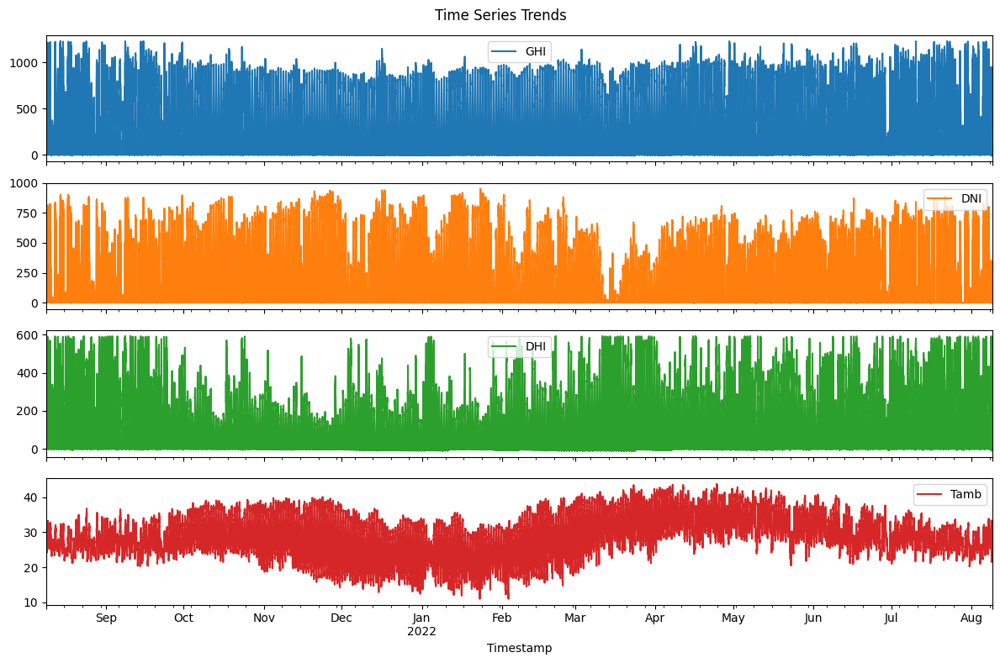

In [21]:
df.set_index('Timestamp', inplace=True)
df[['GHI', 'DNI', 'DHI', 'Tamb']].plot(subplots=True, figsize=(12, 8), title="Time Series Trends")
plt.tight_layout()
plt.show()


## Impact of cleaning on ModA and ModB

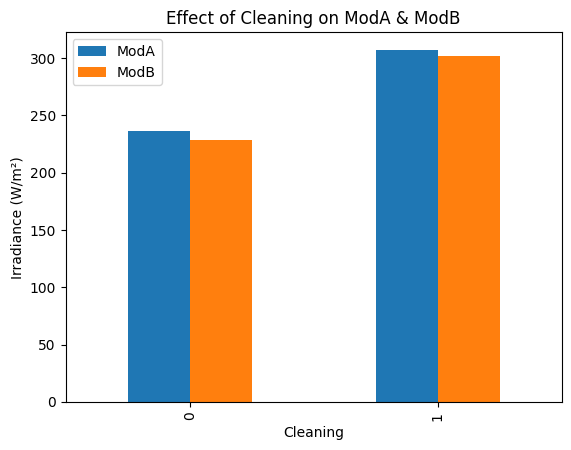

In [22]:
df.groupby('Cleaning')[['ModA', 'ModB']].mean().plot(kind='bar', title='Effect of Cleaning on ModA & ModB')
plt.ylabel('Irradiance (W/m²)')
plt.show()


## Correlation HeatMap


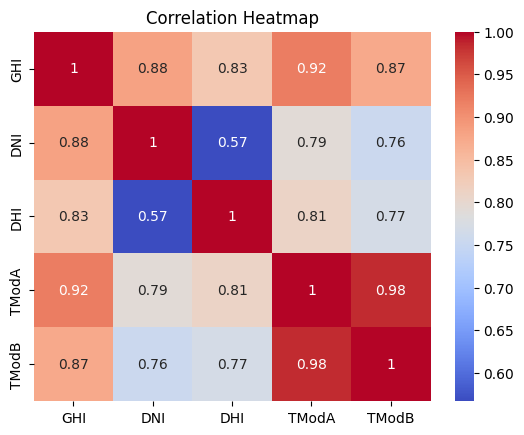

In [23]:
corr_cols = ['GHI', 'DNI', 'DHI', 'TModA', 'TModB']
sns.heatmap(df[corr_cols].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


## Scatter Plot Relationships

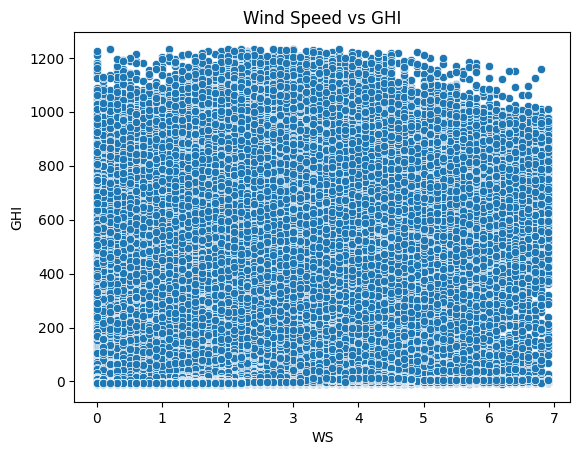

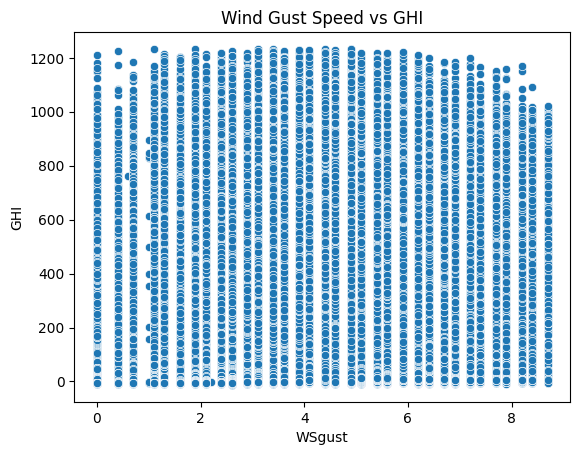

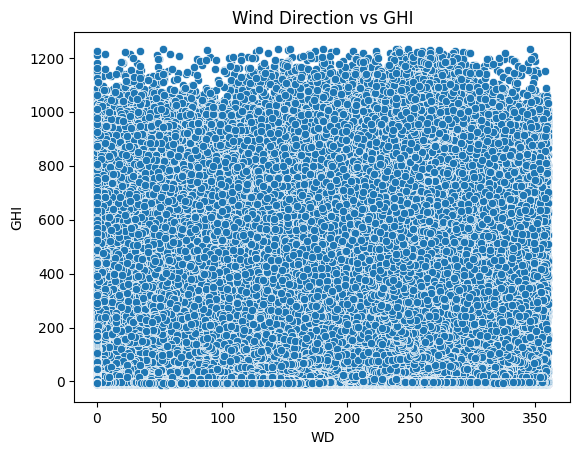

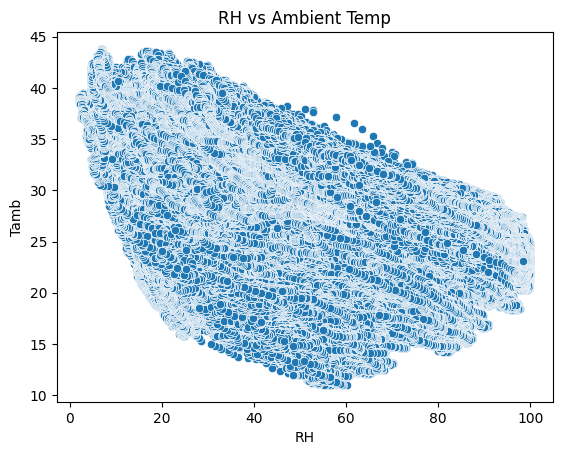

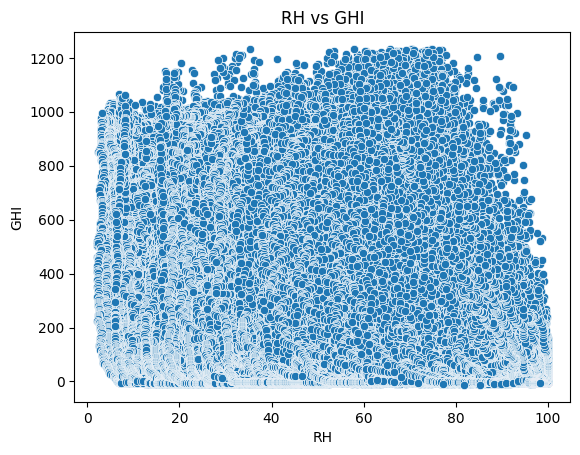

In [24]:
sns.scatterplot(data=df, x='WS', y='GHI')
plt.title('Wind Speed vs GHI')
plt.show()

sns.scatterplot(data=df, x='WSgust', y='GHI')
plt.title('Wind Gust Speed vs GHI')
plt.show()

sns.scatterplot(data=df, x='WD', y='GHI')
plt.title('Wind Direction vs GHI')
plt.show()

sns.scatterplot(data=df, x='RH', y='Tamb')
plt.title('RH vs Ambient Temp')
plt.show()

sns.scatterplot(data=df, x='RH', y='GHI')
plt.title('RH vs GHI')
plt.show()


## Wind Rose(Polar Plot)

In [25]:
import plotly.express as px
fig = px.scatter_polar(df, r='WS', theta='WD', title="Wind Rose")
fig.show()

## Histograms


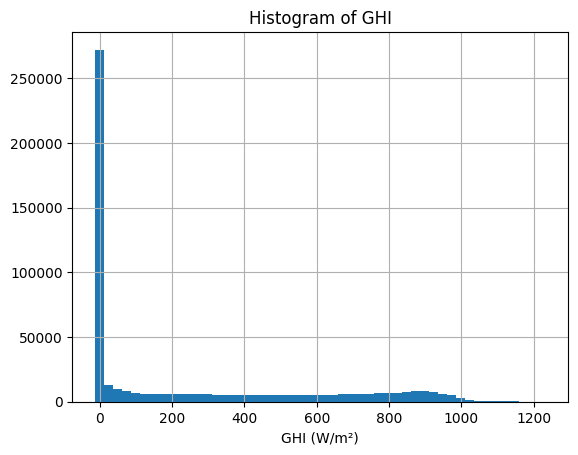

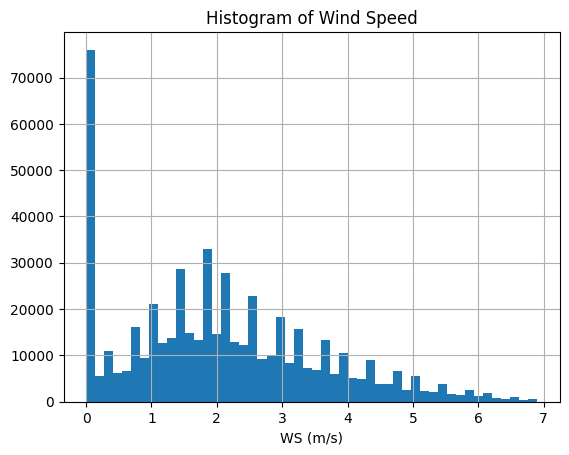

In [26]:
df['GHI'].hist(bins=50)
plt.title('Histogram of GHI')
plt.xlabel('GHI (W/m²)')
plt.show()

df['WS'].hist(bins=50)
plt.title('Histogram of Wind Speed')
plt.xlabel('WS (m/s)')
plt.show()


## Bubble Chart


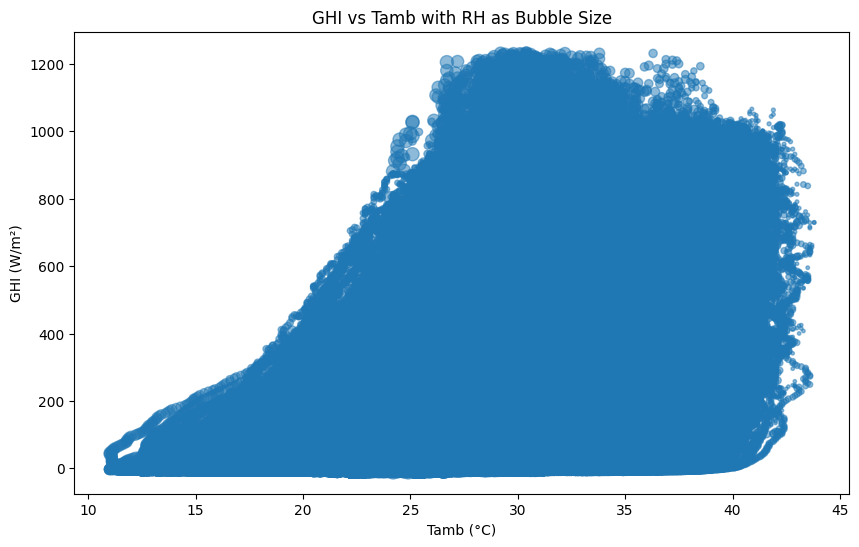

In [27]:
plt.figure(figsize=(10, 6))
plt.scatter(df['Tamb'], df['GHI'], s=df['RH'], alpha=0.5)
plt.xlabel('Tamb (°C)')
plt.ylabel('GHI (W/m²)')
plt.title('GHI vs Tamb with RH as Bubble Size')
plt.show()